# Quantum embeding 

In [24]:
from qiskit import QuantumCircuit
import numpy as np
import matplotlib.pyplot as plt

from lib_Tutorial import display_deformation
!pip install ipympl
%matplotlib inline

### 1 - One qubit encoding 
*The goal of this part is to encode a data point (2 features) on the Bloch Sphere*

In [25]:
# Generate a random data point using a fixed seed for reproducibility
import random

seed = int("uneseedpourleTP".encode('utf-8').hex(),16) % 2025
random.seed(seed)

x_data = random.uniform(0, 1)
y_data = random.uniform(0, 1)

# print the generated random point
print(f"The seed used is {seed}")
print(f"x_data = {x_data}, y_data = {y_data}")

The seed used is 72
x_data = 0.07342665480233157, y_data = 0.5943619291362376


##### 1.1 - Angle encoding on one qubit

The initial value of the encoded data was 0.07342665480233157 


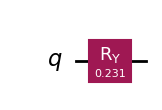

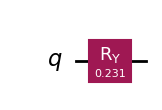

In [26]:
# One qubit angle encoding circuit
qc_angle_encoding = QuantumCircuit(1)

# add the correct gates in order to perform a basic angle encoding of x_data on the qubit
# TO DO
theta = np.pi * x_data
qc_angle_encoding.ry(theta, 0)

# print the circuit
print(f"The initial value of the encoded data was {x_data} ")
#print(qc_angle_encoding)
qc_angle_encoding.draw('mpl')

#### 1.2 - Dense encoding on one qubit

The initial values of the encoded data were (x_data, y_data) = (0.07342665480233157, 0.5943619291362376) 


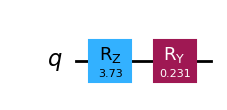

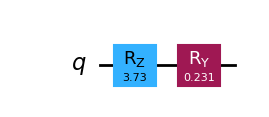

In [19]:
# One qubit dense encoding circuit
qc_dense_encoding = QuantumCircuit(1)

# Add the correct gates in order to perform the dense embedding of (x_data, y_data) on the qubit
# ****Data must be able to cover ALL the bloch sphere****
# TO DO 
theta = np.pi * x_data
phi = 2 * np.pi * y_data
qc_dense_encoding.rz(phi, 0)
qc_dense_encoding.ry(theta, 0)

# print the circuit
print(f"The initial values of the encoded data were (x_data, y_data) = ({x_data}, {y_data}) ")
qc_dense_encoding.draw('mpl') 

#### 1.3 - Dense encoding of a data vector on several qubits

The initial values of the encoded data vector were X = [0.7029155842610357, 0.3428296389618385, 0.379948855514633, 0.6336380170811049, 0.6920158923238119, 0.22199627351205975, 0.8090248481419567, 0.44702127627294486] 


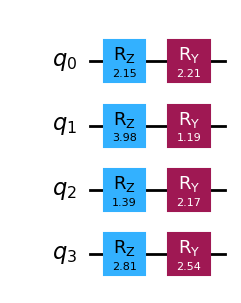

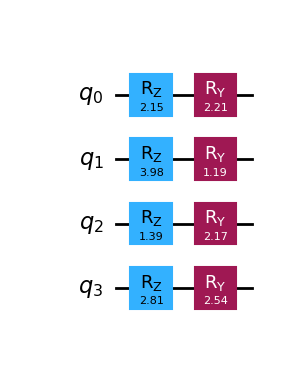

In [20]:
# definition of the data vector to encode
n = 8
X = [random.uniform(0, 1) for _ in range(n)]

# definition of a multi-qubit circuit to encode the data vector using dense encoding
# TO DO
N = n // 2  # number of qubits needed
qc_vector_dense_encoding = QuantumCircuit(N)
for i in range(N):
    theta = np.pi * X[2*i]
    phi = 2 * np.pi * X[2*i + 1]
    qc_vector_dense_encoding.rz(phi, i)
    qc_vector_dense_encoding.ry(theta, i)


# print the circuit
print(f"The initial values of the encoded data vector were X = {X} ")
qc_vector_dense_encoding.draw('mpl') 

### 2 - DataSet embedding on one qubit and visulisation

#### 2.1 - Embedding of a random dataset on the entire Bloch sphere

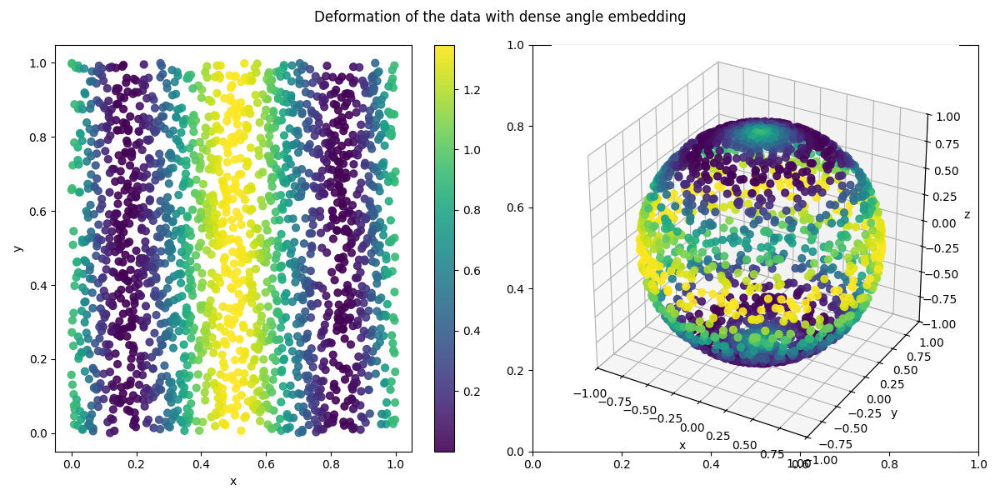

In [28]:
%matplotlib widget

def scale(pt):
    # initial point is in [0;1]x[0;1]
    x, y = pt[0], pt[1]

    # choose a scaling factor in order to map the data to the ENTIRE Bloc Sphere
    # TO DO
    factor_x = np.pi 
    factor_y = 2 * np.pi

    # compute the scaled data point
    scaled_x = x*factor_x
    scaled_y = y*factor_y

    # compute and return the scaled data point
    return (scaled_x, scaled_y)# To be able to rotate the 3D view: uncomment the following line if your Python installation allows it




# Display the "deformation of the data" with the dense angle embedding:
# - This function genereate random points in 2D, apply the scaling function and display the result of the embedding in 3D
# - The color of the points represent the deformfation of the area
fig, ax, ax3d, values = display_deformation([scale],
                                            n_points=2000,range_y=(0,1),range_x=(0,1),
                                            title="Deformation of the data with dense angle embedding",seed=seed, 
                                            point_generation="random")

# Draw the dataset mapped on the Bloch sphere
plt.show(fig)


#### 2.2 - Embedding on a ring avoiding the polar cap regions the Bloch sphere

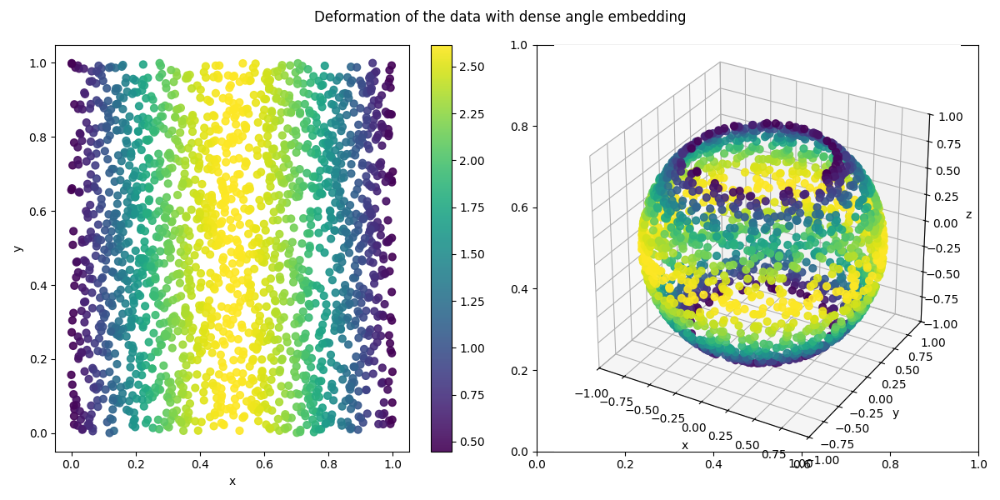

In [7]:
# To be able to rotate the 3D view: uncomment the following line if your Python installation allows it
%matplotlib widget

def scale_ring(pt):
    # initial point is in [0;1]x[0;1]
    x, y = pt[0], pt[1]

    # choose a scaling mechanism that maps data onto a complete ring of the Bloch sphere, avoiding the two polar cap regions
    # TO DO
    scaled_x = x * (1 - 0.4) * np.pi + 0.2 * np.pi
    scaled_y = y * 2 * np.pi

    # compute and return the scaled data point
    return (scaled_x, scaled_y)


# Display the "deformation of the data" with the dense angle embedding:
# - This function genereate random points in 2D, apply the scaling function and display the result of the embedding in 3D
# - The color of the points represent the deformfation of the area
fig, ax, ax3d, values = display_deformation([scale_ring],
                                            n_points=2000,range_y=(0,1),range_x=(0,1),
                                            title="Deformation of the data with dense angle embedding",seed=seed, 
                                            point_generation="random")


#### 2.3 - Embedding of a dataset consisting of 3 clusters

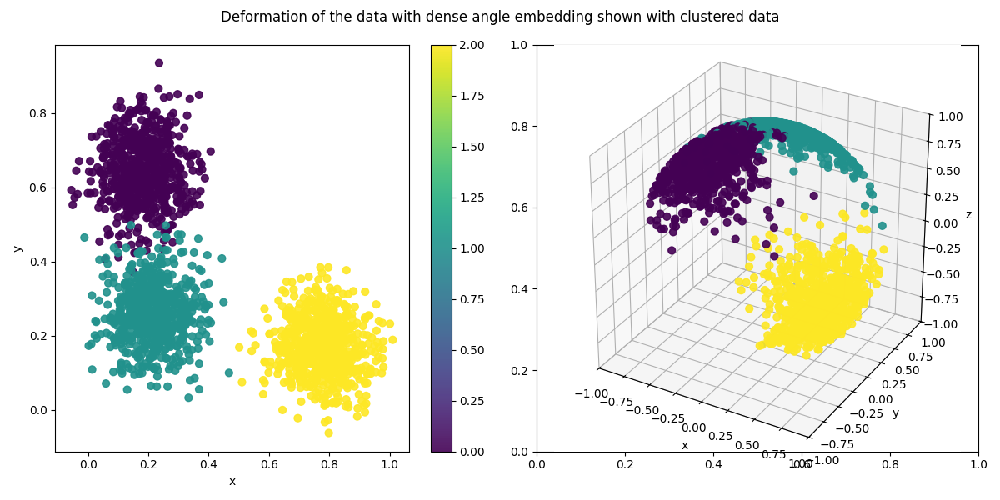

In [8]:

# Another way to see the deformation of the data with the dense angle embedding, considering the scaling fucntion defined in section 2.1,
# with clustered data
fig, ax, ax3d, values = display_deformation([scale],
                                            n_points=1998,
                                            title="Deformation of the data with dense angle embedding shown with clustered data",
                                            seed=seed, 
                                            point_generation="clusters")
ax3d.scatter(0, 0, -1, s=20, alpha=0.9, color='C0')

#### 2.4 - Embedding of a dataset consisting of 4 clusters

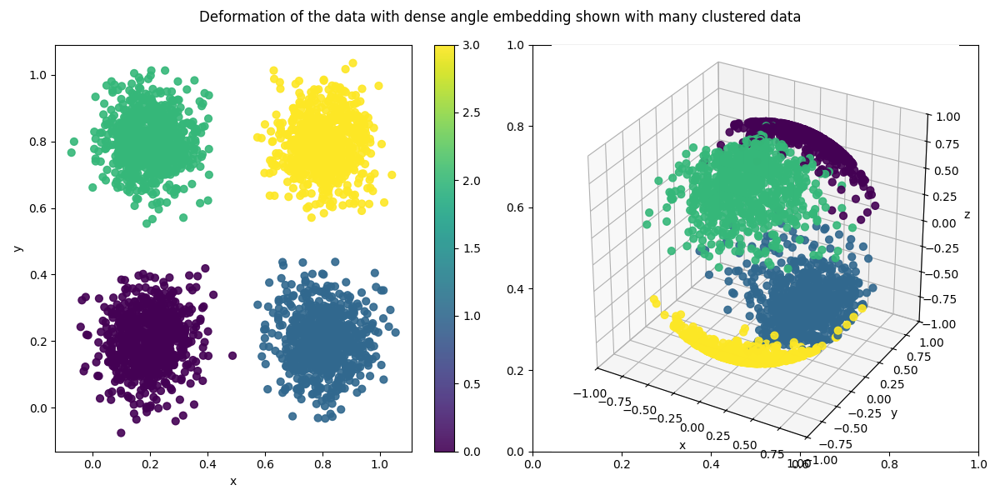

In [9]:
# Worth case scenario with many clusters
init_centers = [(0.2,0.2), (0.8,0.2), (0.2,0.8), (0.8,0.8)]
fig, ax, ax3d, values = display_deformation([scale],
                                            #range_y=(0,2),
                                            n_points=2200,
                                            title="Deformation of the data with dense angle embedding shown with many clustered data",
                                            seed=seed, 
                                            point_generation="clusters",
                                            init_centers=init_centers)

#### 2.5 - Embedding avoiding the poles of the Bloch sphere of a data set composed of 4 clusters

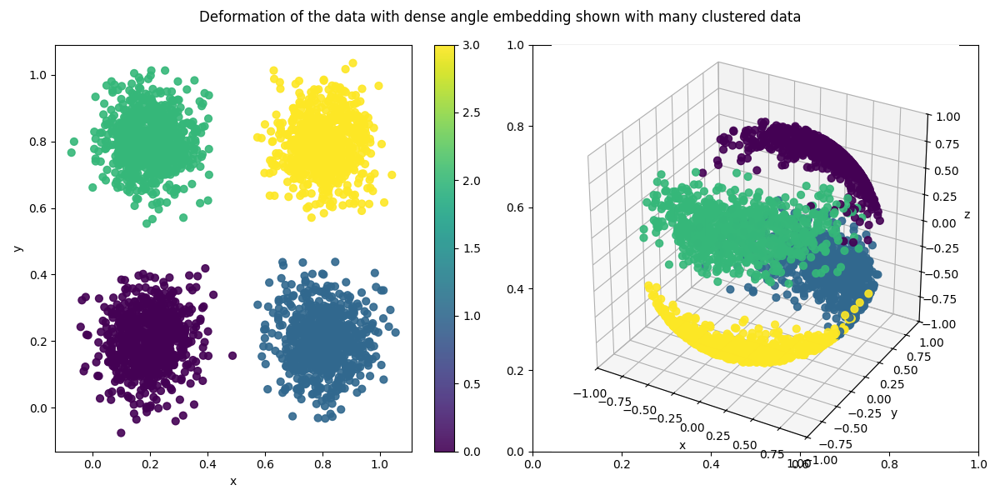

In [10]:
# TO DO 
# Worth case scenario with many clusters mapped on a ring avoiding the poles of the Bloch sphere
init_centers = [(0.2,0.2), (0.8,0.2), (0.2,0.8), (0.8,0.8)]
fig, ax, ax3d, values = display_deformation([scale_ring],
                                            #range_y=(0,2),
                                            n_points=2200,
                                            title="Deformation of the data with dense angle embedding shown with many clustered data",
                                            seed=seed, 
                                            point_generation="clusters",
                                            init_centers=init_centers)

### 3 - Polar decomposition of data

#### 3.1 - Polar decomposition with a dataset mapping the entire intial "square" [0;1]x[0;1]

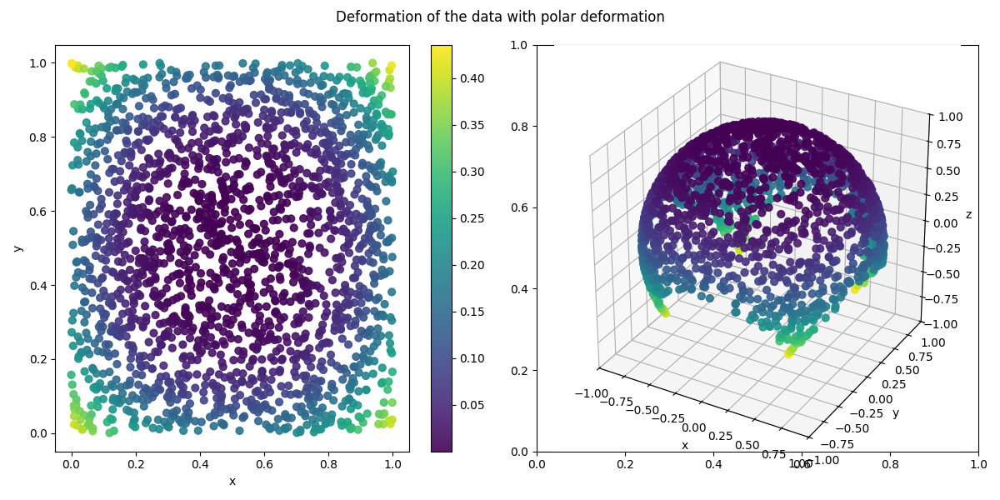

In [11]:
## Think of a way using some kind of polar coordinates to better map the data

def center_data(pt):
    """A deformation function centering the data around (0,0)."""
    x,y = pt[0], pt[1]
    return (x-0.5, y-0.5)

def polar_deformation(pt):
    """A deformation function using polar coordinates."""
    r = np.linalg.norm(pt)
    theta = np.arccos(pt[1]/r)*np.sign(pt[0])
    # Scale r to [0, pi]
    r_scaled = r*np.pi
    return (r_scaled, theta)

deformation_polar_functions = [center_data, polar_deformation,]

# Display the deformation of the data with the polar deformation
fig, ax, ax3d, values = display_deformation(deformation_functions=deformation_polar_functions,
                                            #range_y=(0,1),
                                            n_points=2000,
                                            title="Deformation of the data with polar deformation",
                                            seed=seed, 
                                            point_generation="random")



#### 3.2 - Polar decomposition with a dataset mapping an entire initial disc of diameter = 1

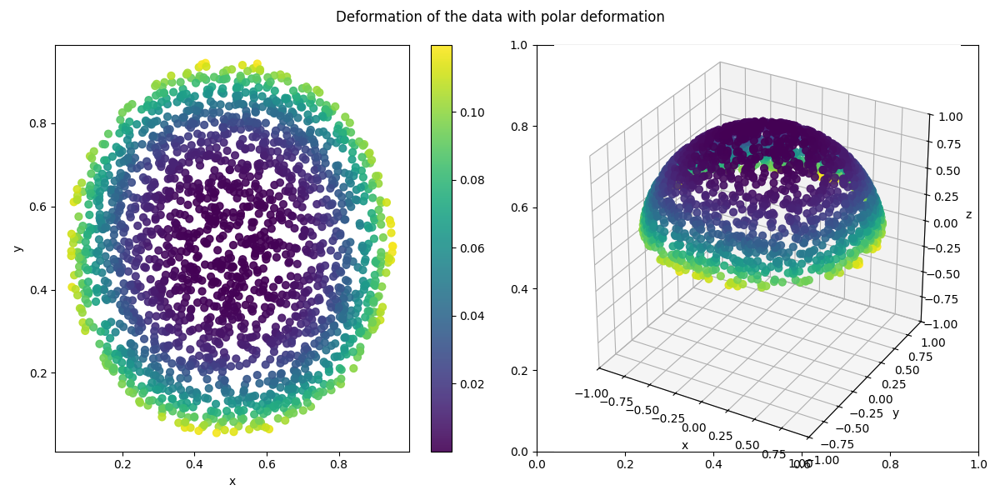

In [12]:
# Display the deformation of the data with the polar deformation
fig, ax, ax3d, values = display_deformation(deformation_functions=deformation_polar_functions,
                                            #range_y=(0,1),
                                            n_points=2000,
                                            title="Deformation of the data with polar deformation",
                                            seed=seed, 
                                            point_generation="random_circle",)

#### 3.3 - Polar decomposition with a dataset consisting of 4 distinct clusters of equal size

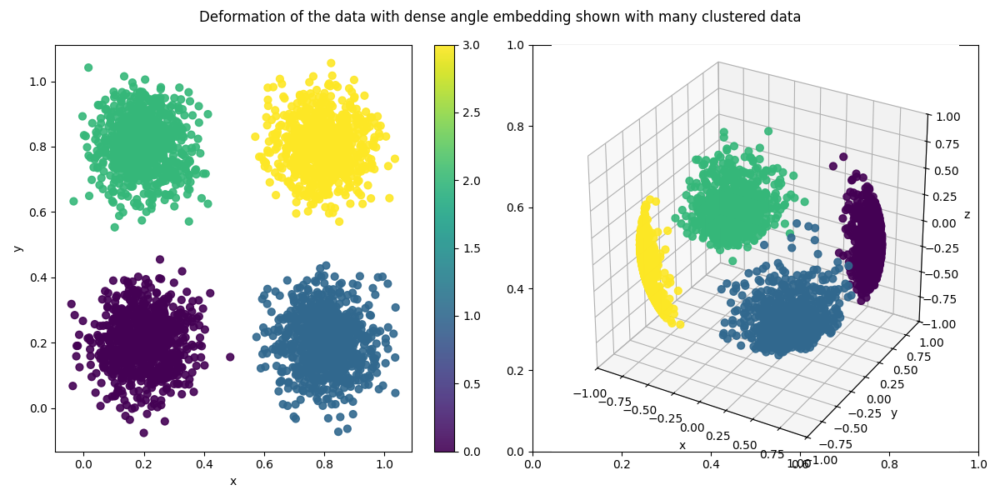

In [17]:
# best case scenario with many clusters
init_centers = [(0.2,0.2), (0.8,0.2), (0.2,0.8), (0.8,0.8)]
fig, ax, ax3d, values = display_deformation(deformation_functions=deformation_polar_functions,
                                            n_points=2500,
                                            title="Deformation of the data with dense angle embedding shown with many clustered data",
                                            seed=seed, 
                                            point_generation="clusters",
                                            init_centers=init_centers)


#### 3.3 - Polar decomposition with a dataset consisting of 4 random clusters (random centers and sizes)

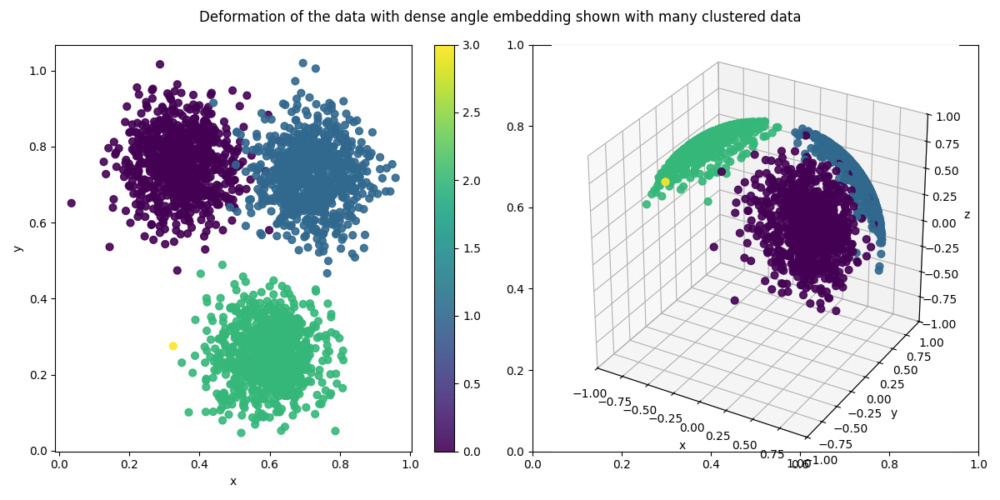

In [14]:
# Random case (random centers and sizes)
fig, ax, ax3d, values = display_deformation(deformation_functions=deformation_polar_functions,
                                            n_points=2500,
                                            title="Deformation of the data with dense angle embedding shown with many clustered data",
                                            seed=seed+4, 
                                            point_generation="clusters")


### 4 - Polar decomposition with Lambert Azimuthal Equal-Area (LAEA) projection

Have a look at the [Wiki of LAEA projection](https://en.wikipedia.org/wiki/Lambert_azimuthal_equal-area_projection)

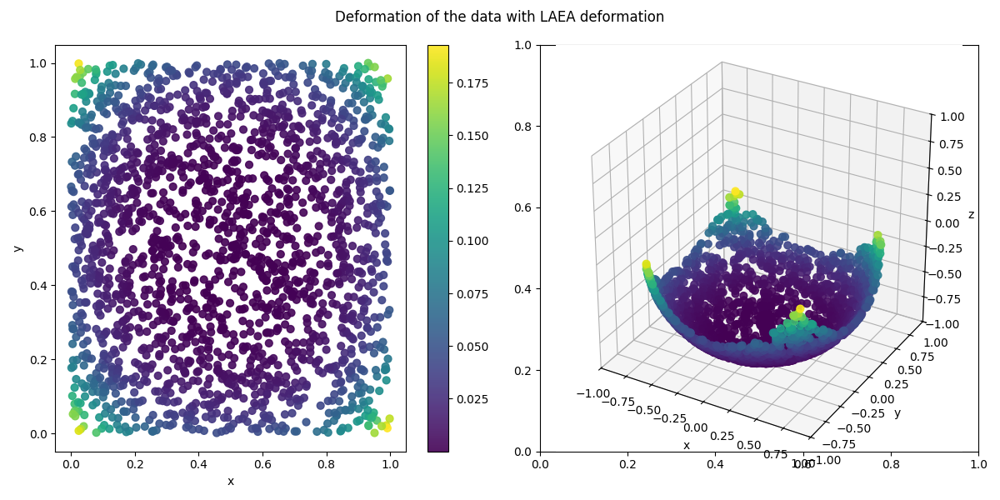

In [15]:
def center_data(pt):
    """A deformation function centering the data around (0,0)."""
    x,y = pt[0], pt[1]
    return (x-0.5, y-0.5)

def laea_deformation(pt):
    """A deformation function using polar coordinates."""
    x,y = pt[0], pt[1]
    r = np.linalg.norm(pt)
    theta = np.arccos(pt[1]/r)*np.sign(pt[0])
    return (2*np.arccos(r/2), theta)

def move_data(pt):
    """A deformation function centering the data around (0,0)."""
    x,y = pt[0], pt[1]
    x, y = (x-0.5, y-0.5)
    factor = 2
    return (x*factor, y*factor)

deformation_polar_functions = [move_data,laea_deformation]

# Display the deformation of the data with the polar deformation
fig, ax, ax3d, values = display_deformation(deformation_functions=deformation_polar_functions,
                                            #range_y=(0,1),
                                            n_points=2000,
                                            title="Deformation of the data with LAEA deformation",
                                            seed=seed+4, 
                                            point_generation="random",
                                            init_centers=init_centers)

### 5 - Stereographic projection

Have a look at the [Wiki of the stereographic projection](https://en.wikipedia.org/wiki/Stereographic_projection)

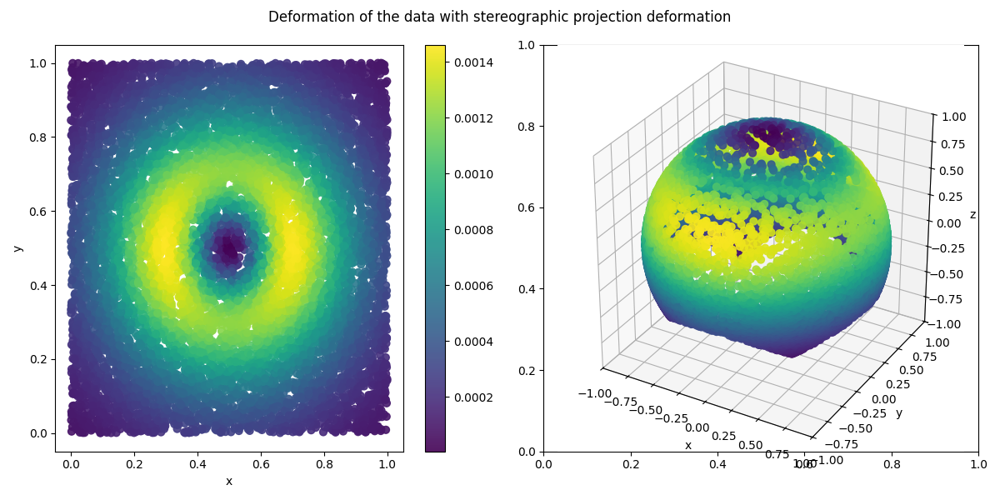

In [30]:
# stereographique projection

# best case scenario with many clusters
init_centers = [(0.2,0.2), (0.8,0.2), (0.2,0.8), (0.8,0.8)]


def center_data(pt):
    """A deformation function centering the data around (0,0)."""
    x,y = pt[0], pt[1]
    return (x-0.5, y-0.5)

def stetographique_deformation(pt):
    """A deformation function using polar coordinates."""
    
    x,y = pt[0], pt[1]

    r = np.linalg.norm(pt)
    theta = np.arccos(pt[1]/r)*np.sign(pt[0])
    r = 2*np.sqrt(2)*r
    
    return (2*(np.pi-np.arctan(r)),theta)


deformation_polar_functions = [center_data,stetographique_deformation]

# Display the deformation of the data with the polar deformation
fig, ax, ax3d, values = display_deformation(deformation_functions=deformation_polar_functions,
                                            range_y=(0,1),
                                            n_points=10000,
                                            title="Deformation of the data with stereographic projection deformation",
                                            seed=seed+4, 
                                            point_generation="random",
                                            init_centers=init_centers)

